#  Homework Assignment

**Name:** Negin Raki 
**Subject:** Data_science , HW01  
**Student Number:** 402101758  

---

##  Introduction
The data which is used in this assignment give us some informations about users who are searching about where to travel an wether they finaly book a hotel or not.


This table gives us all we need to know about the columns of dataset
<center>
<div style="line-height:200%; font-family:Arial; font-size:medium">

| Column Name | Description |
|:----------:|:------------------:|
| <code>user</code> | User identifier |
| <code>user_location_country</code> | User's country identifier |
| <code>user_location_region</code> | User's region identifier |
| <code>user_location_city</code> | User's city identifier |
| <code>destination_distance</code> | Physical distance between the user and the hotel at the time of search (<code>null</code> means the distance could not be calculated) |
| <code>search_date</code> | Time when the search was performed |
| <code>is_mobile</code> | Whether the user performed the search using a mobile device |
| <code>is_package</code> | Whether the user is searching for a hotel together with transportation tickets (bus, airplane, or train) |
| <code>channel</code> | The channel through which the user entered the website (SMS ads, social media ads, direct entry, etc.) |
| <code>Search_count</code> | Number of similar searches by the user at that moment (within the same session) |
| <code>checkIn_date</code> | Hotel check-in date |
| <code>checkOut_date</code> | Hotel check-out date |
| <code>n_adults</code> | Number of adults specified for the hotel reservation |
| <code>n_children</code> | Number of children specified for the hotel reservation |
| <code>n_rooms</code> | Number of rooms requested for booking |
| <code>destination</code> | Identifier of the user's desired hotel location (may overlap, such as New York, New York City, Central Park, etc.) |
| <code>destination_type</code> | Code representing the type of destination or hotel requested by the user |
| <code>hotel_continent</code> | Continent identifier of the hotel |
| <code>hotel_country</code> | Country identifier of the hotel |
| <code>hotel_market</code> | Market area where the hotel is located (non-overlapping regions such as New York, Boston, etc.) |
| <code>hotel_category</code> | Category grouping of the hotel whose details are viewed (e.g., star rating or hotel type) |
| <code>is_booking</code> | Whether the user eventually booked the viewed hotel or not |

</div>
</center>




# 1. Exploratory Analysis and Data Cleaning

---

In [151]:
import numpy as np 
import pandas as pd


In [152]:
import matplotlib.pyplot as plt


## Load the dataset:

In [153]:
df=pd.read_csv('new_train.csv');
print("Dataset shape:", df.shape)
print("\nFirst 5 rows:")
df.head()




Dataset shape: (100000, 22)

First 5 rows:


,user,user_location_country,user_location_region,user_location_city,destination_distance,search_date,is_mobile,is_package,channel,search_count,...,n_adults,n_children,n_rooms,destination,destination_type,hotel_continent,hotel_country,hotel_market,hotel_category,is_booking
0,461899,3,50,5703,NaN,2013-01-07 00:00:02,0,0,9,1,...,2,1,1,669,3,2,50,212,41,0
1,13796,66,174,21177,5713.6206,2013-01-07 00:00:06,0,0,9,3,...,1,0,1,8821,1,6,17,30,58,0
2,1128575,205,155,14703,795.7298,2013-01-07 00:00:06,0,0,9,1,...,1,0,1,25064,6,2,50,1230,91,0
3,1080476,69,761,41949,NaN,2013-01-07 00:00:17,0,1,9,1,...,2,0,1,7635,3,2,50,675,10,0
4,1080476,69,761,41949,NaN,2013-01-07 00:00:23,0,1,9,1,...,2,0,1,7635,3,2,50,675,10,0


In [154]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   user                   100000 non-null  int64  
 1   user_location_country  100000 non-null  int64  
 2   user_location_region   100000 non-null  int64  
 3   user_location_city     100000 non-null  int64  
 4   destination_distance   64334 non-null   float64
 5   search_date            100000 non-null  object 
 6   is_mobile              100000 non-null  int64  
 7   is_package             100000 non-null  int64  
 8   channel                100000 non-null  int64  
 9   search_count           100000 non-null  int64  
 10  checkIn_date           99543 non-null   object 
 11  checkOut_date          99543 non-null   object 
 12  n_adults               100000 non-null  int64  
 13  n_children             100000 non-null  int64  
 14  n_rooms                100000 non-nul

Dates like check in and check out dates are saved as objects which we should make some changes on them.

Also, we can see we have some colmuns that have null values.

Another thing that we should notice is that,**not all of the columns which are int64 depicts a scalared data** .For expmale, user id or the columns which refer to country ,region and city are giving codes which they are individual and they are used as categorical codes.


As user Ids cannot help us in comperhending the dataset ,its better to be deleted.

In [155]:
df=df.drop(columns='user')

       destination_distance   search_count       n_adults     n_children  \
count          64334.000000  100000.000000  100000.000000  100000.000000   
mean            2081.024982       1.770670       1.989870       0.403490   
std             2195.285580       1.537329       0.891457       0.746975   
min                0.005600       1.000000       1.000000       0.000000   
25%              449.001900       1.000000       2.000000       0.000000   
50%             1354.435400       1.000000       2.000000       0.000000   
75%             2605.198400       2.000000       2.000000       1.000000   
max            11675.600000      39.000000       9.000000       9.000000   

             n_rooms  
count  100000.000000  
mean        1.111360  
std         0.455281  
min         1.000000  
25%         1.000000  
50%         1.000000  
75%         1.000000  
max         8.000000  


DISTRIBUTION ANALYSIS FOR NUMMERICAL DATAS

user_location_country:
  Number of unique categories: 169
  Mo

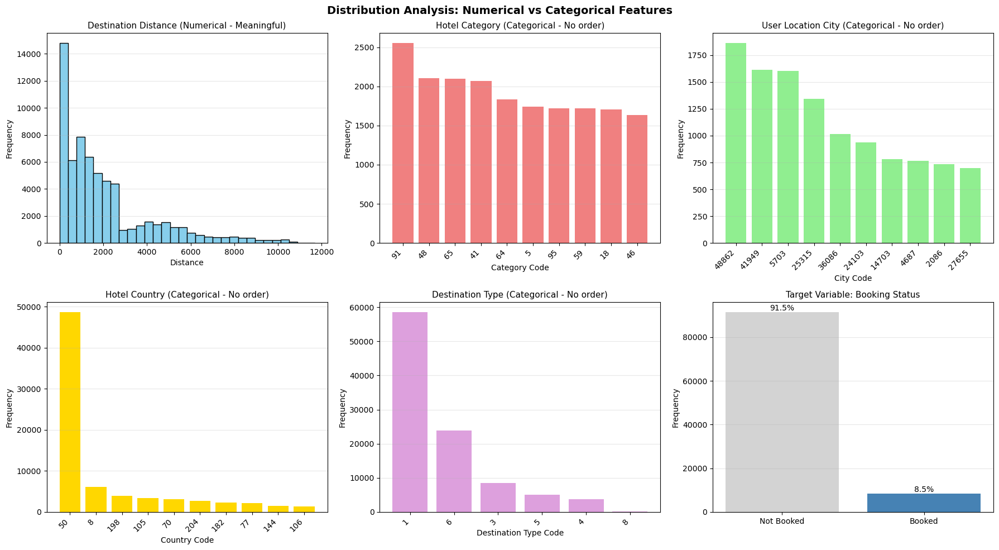

In [156]:
#  Separate Analysis for Different Data Types

CATEGORICAL_AS_INT = [
    'user_location_country', 'user_location_region', 'user_location_city',
    'destination', 'destination_type', 'hotel_continent', 
    'hotel_country', 'hotel_market', 'hotel_category'
]

TRUE_NUMERICAL = [
    'destination_distance', 'search_count', 'n_adults', 
    'n_children', 'n_rooms'
]

numerical_df = df[TRUE_NUMERICAL]
print(numerical_df.describe())
print("\n")
print("DISTRIBUTION ANALYSIS FOR NUMMERICAL DATAS")
for col in CATEGORICAL_AS_INT:
    if col in df.columns:
        print(f"\n{col}:")
        print(f"  Number of unique categories: {df[col].nunique()}")
        print(f"  Most frequent values:")
        print(df[col].value_counts().head(5))
        print(f"  Missing values: {df[col].isnull().sum()}")

#  Visual comparison

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Distribution Analysis: Numerical vs Categorical Features', fontsize=14, fontweight='bold')

# Flatten axes for easier indexing (2x3 becomes 1x6)
axes_flat = axes.flatten()

# Plot 1: True numerical column (destination_distance)
if 'destination_distance' in df.columns:
    axes_flat[0].hist(df['destination_distance'].dropna(), bins=30, edgecolor='black', color='skyblue')
    axes_flat[0].set_title('Destination Distance (Numerical - Meaningful)', fontsize=11)
    axes_flat[0].set_xlabel('Distance')
    axes_flat[0].set_ylabel('Frequency')
    axes_flat[0].grid(axis='y', alpha=0.3)

# Plot 2: Hotel Category
if 'hotel_category' in df.columns:
    value_counts = df['hotel_category'].value_counts().head(10)
    axes_flat[1].bar(range(len(value_counts)), value_counts.values, color='lightcoral')
    axes_flat[1].set_title('Hotel Category (Categorical - No order)', fontsize=11)
    axes_flat[1].set_xlabel('Category Code')
    axes_flat[1].set_ylabel('Frequency')
    axes_flat[1].set_xticks(range(len(value_counts)))
    axes_flat[1].set_xticklabels(value_counts.index, rotation=45, ha='right')
    axes_flat[1].grid(axis='y', alpha=0.3)

# Plot 3: User Location City
if 'user_location_city' in df.columns:
    value_counts_city = df['user_location_city'].value_counts().head(10)
    axes_flat[2].bar(range(len(value_counts_city)), value_counts_city.values, color='lightgreen')
    axes_flat[2].set_title('User Location City (Categorical - No order)', fontsize=11)
    axes_flat[2].set_xlabel('City Code')
    axes_flat[2].set_ylabel('Frequency')
    axes_flat[2].set_xticks(range(len(value_counts_city)))
    axes_flat[2].set_xticklabels(value_counts_city.index, rotation=45, ha='right')
    axes_flat[2].grid(axis='y', alpha=0.3)

# Plot 4: Hotel Country
if 'hotel_country' in df.columns:
    value_counts_country = df['hotel_country'].value_counts().head(10)
    axes_flat[3].bar(range(len(value_counts_country)), value_counts_country.values, color='gold')
    axes_flat[3].set_title('Hotel Country (Categorical - No order)', fontsize=11)
    axes_flat[3].set_xlabel('Country Code')
    axes_flat[3].set_ylabel('Frequency')
    axes_flat[3].set_xticks(range(len(value_counts_country)))
    axes_flat[3].set_xticklabels(value_counts_country.index, rotation=45, ha='right')
    axes_flat[3].grid(axis='y', alpha=0.3)

# Plot 5: Destination Type
if 'destination_type' in df.columns:
    value_counts_dest_type = df['destination_type'].value_counts().head(10)
    axes_flat[4].bar(range(len(value_counts_dest_type)), value_counts_dest_type.values, color='plum')
    axes_flat[4].set_title('Destination Type (Categorical - No order)', fontsize=11)
    axes_flat[4].set_xlabel('Destination Type Code')
    axes_flat[4].set_ylabel('Frequency')
    axes_flat[4].set_xticks(range(len(value_counts_dest_type)))
    axes_flat[4].set_xticklabels(value_counts_dest_type.index, rotation=45, ha='right')
    axes_flat[4].grid(axis='y', alpha=0.3)

# Plot 6: Booking distribution (bonus)
if 'is_booking' in df.columns:
    booking_counts = df['is_booking'].value_counts()
    axes_flat[5].bar(['Not Booked', 'Booked'], booking_counts.values, color=['lightgray', 'steelblue'])
    axes_flat[5].set_title('Target Variable: Booking Status', fontsize=11)
    axes_flat[5].set_ylabel('Frequency')
    axes_flat[5].grid(axis='y', alpha=0.3)
    
    # Add percentage labels
    for i, (bar, val) in enumerate(zip(axes_flat[5].patches, booking_counts.values)):
        pct = val / len(df) * 100
        axes_flat[5].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 5, 
                         f'{pct:.1f}%', ha='center', va='bottom')



plt.tight_layout()
plt.show()

## correlations

CORRELATION ANALYSIS: Numerical Features

Correlation with Booking (is_booking):
is_booking              1.0000
n_rooms                 0.0093
n_children             -0.0289
destination_distance   -0.0467
n_adults               -0.0670
Name: is_booking, dtype: float64


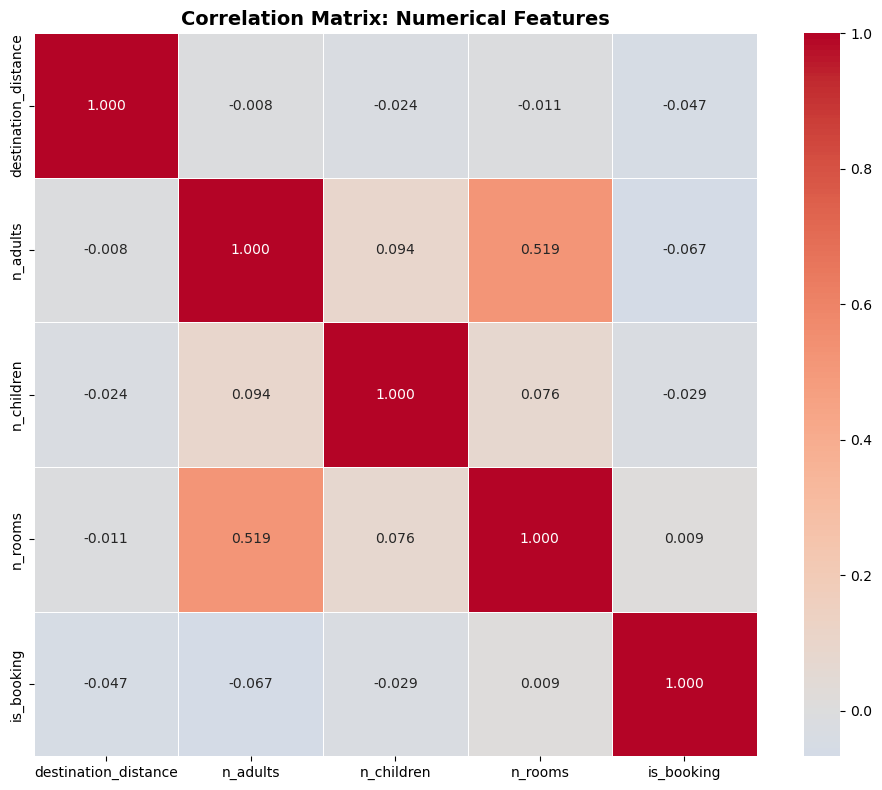

STRONGEST PREDICTORS OF HOTEL BOOKING
n_rooms             : +0.0093 (Weak positive correlation)
n_children          : -0.0289 (Weak negative correlation)
destination_distance: -0.0467 (Weak negative correlation)
n_adults            : -0.0670 (Weak negative correlation)
RELATIONSHIPS BETWEEN FEATURES

Highly correlated feature pairs (|corr| > 0.3):
  n_adults ↔ n_rooms: 0.519


In [157]:

import matplotlib.pyplot as plt
import seaborn as sns

# 1. CORRELATION BETWEEN TRUE NUMERICAL FEATURES
true_numerical = ['destination_distance', 'Search_count', 'n_adults', 'n_children', 'n_rooms']
true_numerical = [col for col in true_numerical if col in df.columns]

print("CORRELATION ANALYSIS: Numerical Features")

# Calculate correlation matrix
corr_matrix = df[true_numerical + ['is_booking']].corr()

print("\nCorrelation with Booking (is_booking):")
print(corr_matrix['is_booking'].sort_values(ascending=False).round(4))

# Visualize correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0, 
            fmt='.3f', square=True, linewidths=0.5)
plt.title('Correlation Matrix: Numerical Features', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# 2. FIND STRONGEST PREDICTORS OF BOOKING

print("STRONGEST PREDICTORS OF HOTEL BOOKING")

# Get correlations with is_booking (excluding is_booking itself)
booking_corr = corr_matrix['is_booking'].drop('is_booking').sort_values(ascending=False)

for feature, corr in booking_corr.items():
    strength = "Strong" if abs(corr) > 0.3 else "Moderate" if abs(corr) > 0.1 else "Weak"
    direction = "positive" if corr > 0 else "negative"
    print(f"{feature:20s}: {corr:+.4f} ({strength} {direction} correlation)")


# 3. RELATIONSHIPS BETWEEN FEATURES

print("RELATIONSHIPS BETWEEN FEATURES")

# Find highly correlated feature pairs (excluding is_booking)
corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if corr_matrix.columns[j] != 'is_booking':  # Skip target for now
            corr_value = corr_matrix.iloc[i, j]
            if abs(corr_value) > 0.3:  # Threshold for meaningful correlation
                corr_pairs.append({
                    'Feature 1': corr_matrix.columns[i],
                    'Feature 2': corr_matrix.columns[j],
                    'Correlation': corr_value
                })

if corr_pairs:
    print("\nHighly correlated feature pairs (|corr| > 0.3):")
    for pair in sorted(corr_pairs, key=lambda x: abs(x['Correlation']), reverse=True):
        print(f"  {pair['Feature 1']} ↔ {pair['Feature 2']}: {pair['Correlation']:.3f}")
else:
    print("No highly correlated feature pairs found.")

C:\Users\rakyn\AppData\Local\Temp\ipykernel_12216\73370507.py:43: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



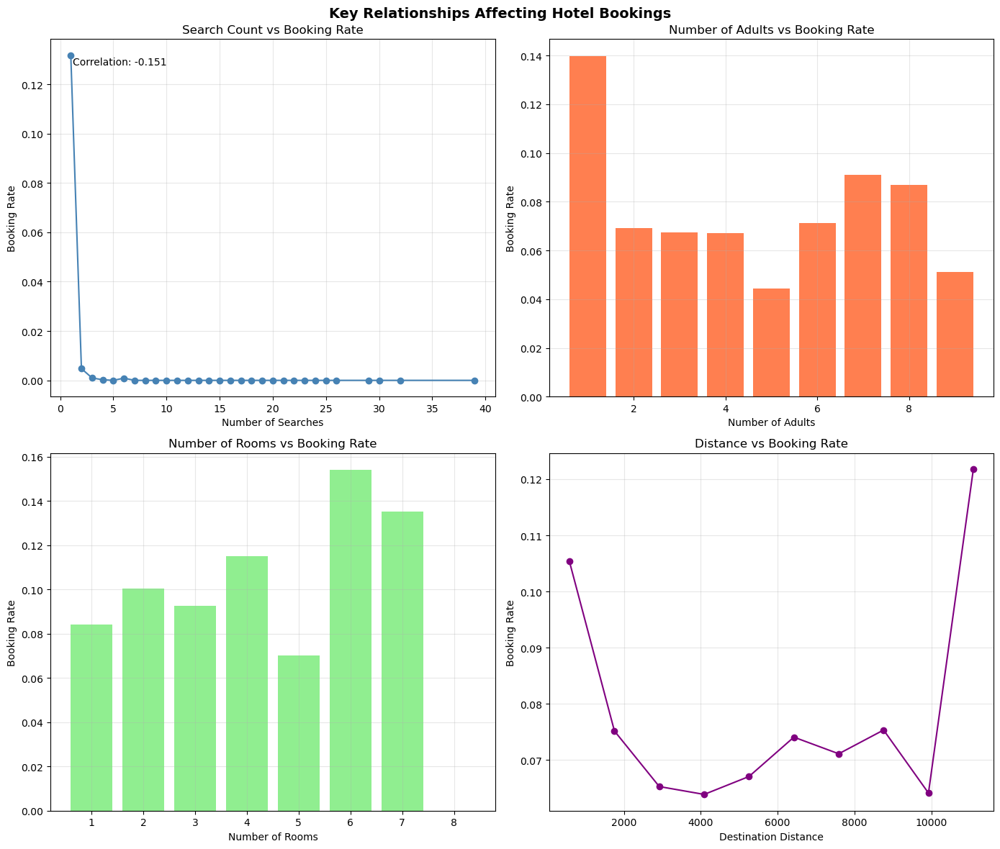

In [158]:
# 4. SCATTER PLOTS FOR KEY RELATIONSHIPS

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
fig.suptitle('Key Relationships Affecting Hotel Bookings', fontsize=14, fontweight='bold')

# Relationship 1: Search Count vs Booking
if 'search_count' in df.columns:
    # Group by Search_count and calculate booking rate
    search_booking = df.groupby('search_count')['is_booking'].mean().reset_index()
    axes[0,0].plot(search_booking['search_count'], search_booking['is_booking'], 'o-', color='steelblue')
    axes[0,0].set_xlabel('Number of Searches')
    axes[0,0].set_ylabel('Booking Rate')
    axes[0,0].set_title('Search Count vs Booking Rate')
    axes[0,0].grid(True, alpha=0.3)
    
    # Add correlation
    corr_val = df['search_count'].corr(df['is_booking'])
    axes[0,0].text(0.05, 0.95, f'Correlation: {corr_val:.3f}', 
                   transform=axes[0,0].transAxes, fontsize=10, verticalalignment='top')

# Relationship 2: Number of Adults vs Booking
if 'n_adults' in df.columns:
    adult_booking = df.groupby('n_adults')['is_booking'].mean().reset_index()
    axes[0,1].bar(adult_booking['n_adults'], adult_booking['is_booking'], color='coral')
    axes[0,1].set_xlabel('Number of Adults')
    axes[0,1].set_ylabel('Booking Rate')
    axes[0,1].set_title('Number of Adults vs Booking Rate')
    axes[0,1].grid(True, alpha=0.3)

# Relationship 3: Number of Rooms vs Booking
if 'n_rooms' in df.columns:
    room_booking = df.groupby('n_rooms')['is_booking'].mean().reset_index()
    axes[1,0].bar(room_booking['n_rooms'], room_booking['is_booking'], color='lightgreen')
    axes[1,0].set_xlabel('Number of Rooms')
    axes[1,0].set_ylabel('Booking Rate')
    axes[1,0].set_title('Number of Rooms vs Booking Rate')
    axes[1,0].grid(True, alpha=0.3)

# Relationship 4: Destination Distance vs Booking (binned)
if 'destination_distance' in df.columns:
    # Create distance bins
    df['distance_bin'] = pd.cut(df['destination_distance'], bins=10)
    distance_booking = df.groupby('distance_bin')['is_booking'].mean().reset_index()
    distance_booking['distance_mid'] = distance_booking['distance_bin'].apply(
        lambda x: x.mid if pd.notnull(x) else 0
    )
    axes[1,1].plot(distance_booking['distance_mid'], distance_booking['is_booking'], 
                   'o-', color='purple')
    axes[1,1].set_xlabel('Destination Distance')
    axes[1,1].set_ylabel('Booking Rate')
    axes[1,1].set_title('Distance vs Booking Rate')
    axes[1,1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

CATEGORICAL VARIABLES ASSOCIATION WITH BOOKING (Cramér's V)
(0 = no association, 1 = perfect association)
is_mobile           : 0.0303 (Weak association)
is_package          : 0.0397 (Weak association)
hotel_category      : 0.1109 (Moderate association)
destination_type    : 0.0371 (Weak association)
channel             : 0.0654 (Weak association)
CRAMÉR'S V HEATMAP: Categorical Variables


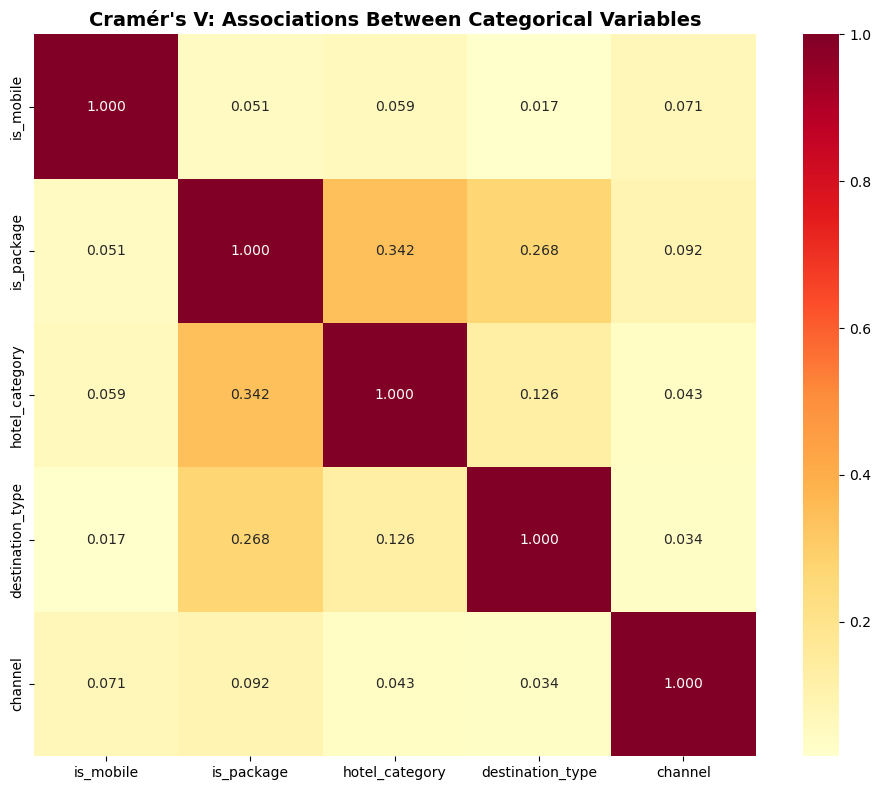

In [159]:
# 5. CRAMÉR'S V FOR CATEGORICAL VARIABLES

from scipy.stats import chi2_contingency

def cramers_v(x, y):
    """Calculate Cramér's V statistic for categorical-categorical association"""
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

# Categorical columns to analyze
categorical_cols = ['is_mobile', 'is_package', 'hotel_category', 'destination_type', 'channel']

# Calculate Cramér's V with target (is_booking)
print("CATEGORICAL VARIABLES ASSOCIATION WITH BOOKING (Cramér's V)")
print("(0 = no association, 1 = perfect association)")

for col in categorical_cols:
    if col in df.columns:
        cramers_v_val = cramers_v(df[col], df['is_booking'])
        strength = "Strong" if cramers_v_val > 0.3 else "Moderate" if cramers_v_val > 0.1 else "Weak"
        print(f"{col:20s}: {cramers_v_val:.4f} ({strength} association)")

# Create heatmap for categorical variables
print("CRAMÉR'S V HEATMAP: Categorical Variables")

# Filter existing categorical columns
existing_cat_cols = [col for col in categorical_cols if col in df.columns]

# Calculate Cramér's V for all pairs
cramers_matrix = pd.DataFrame(index=existing_cat_cols, columns=existing_cat_cols)

for i, col1 in enumerate(existing_cat_cols):
    for j, col2 in enumerate(existing_cat_cols):
        if i == j:
            cramers_matrix.loc[col1, col2] = 1.0
        else:
            cramers_matrix.loc[col1, col2] = cramers_v(df[col1], df[col2])

# Convert to float
cramers_matrix = cramers_matrix.astype(float)

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cramers_matrix, annot=True, cmap='YlOrRd', fmt='.3f', square=True)
plt.title("Cramér's V: Associations Between Categorical Variables", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


---
## KEY INSIGHTS FROM CORRELATION ANALYSIS
---
• Users who search more are less likely to book (corr: -0.151)

• Number of adults has a decreaseing effect on booking (corr: -0.067)

• DESKTOP users show 2.7% lower booking rates

• Package deals decrease booking rates by 2.5%


## Data cleaning 
---

In [160]:
(df.isnull().sum())/len(df)


user_location_country    0.00000
user_location_region     0.00000
user_location_city       0.00000
destination_distance     0.35666
search_date              0.00000
is_mobile                0.00000
is_package               0.00000
channel                  0.00000
search_count             0.00000
checkIn_date             0.00457
checkOut_date            0.00457
n_adults                 0.00000
n_children               0.00000
n_rooms                  0.00000
destination              0.00000
destination_type         0.00000
hotel_continent          0.00000
hotel_country            0.00000
hotel_market             0.00000
hotel_category           0.00000
is_booking               0.00000
distance_bin             0.35666
dtype: float64

In [161]:
df['checkIn_date'] = df['checkIn_date'].fillna(df['checkIn_date'].mode()[0])
df['checkOut_date'] = df['checkOut_date'].fillna(df['checkOut_date'].mode()[0])


for filling the distnation_distance null features, we will get mean of  distnation_distance of rows which have the same destination and user_location_city code 

In [162]:
mean = df.groupby(['user_location_region', 'destination'])['destination_distance'].mean()

df['destination_distance'] = df['destination_distance'].fillna(
    df.groupby(['user_location_city','destination'])['destination_distance'].transform('mean')
)
print(f"Null values after group fill: {df['destination_distance'].isnull().sum()}")


Null values after group fill: 35096


In [163]:
df['destination_distance'].fillna(df['destination_distance'].mean(), inplace=True)

C:\Users\rakyn\AppData\Local\Temp\ipykernel_12216\1475925266.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [164]:
df.describe()

,user_location_country,user_location_region,user_location_city,destination_distance,is_mobile,is_package,channel,search_count,n_adults,n_children,n_rooms,destination,destination_type,hotel_continent,hotel_country,hotel_market,hotel_category,is_booking
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,87.640680,320.865930,28018.448280,2080.931025,0.108710,0.274080,6.148960,1.770670,1.989870,0.403490,1.111360,13788.739470,2.692590,3.139190,78.877290,584.534470,49.986610,0.085420
std,60.037788,211.613155,16720.065765,1767.437676,0.311277,0.446052,3.714777,1.537329,0.891457,0.746975,0.455281,9961.610645,2.160911,1.587917,54.955466,504.454224,29.273731,0.279507
min,0.000000,0.000000,3.000000,0.005600,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,4.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,66.000000,174.000000,13586.000000,988.742400,0.000000,0.000000,2.000000,1.000000,2.000000,0.000000,1.000000,8266.000000,1.000000,2.000000,50.000000,153.000000,25.000000,0.000000
50%,66.000000,318.000000,27655.000000,2080.931025,0.000000,0.000000,9.000000,1.000000,2.000000,0.000000,1.000000,9147.000000,1.000000,2.000000,50.000000,582.000000,49.000000,0.000000
75%,71.000000,395.000000,42328.000000,2080.931025,0.000000,1.000000,9.000000,2.000000,2.000000,1.000000,1.000000,17614.000000,5.000000,4.000000,105.000000,701.000000,75.000000,0.000000
max,239.000000,1021.000000,56507.000000,11675.600000,1.000000,1.000000,9.000000,39.000000,9.000000,9.000000,8.000000,56396.000000,8.000000,6.000000,212.000000,2117.000000,99.000000,1.000000


As we mentioned that most of the int64 columns are categorical, so we cannot gain lots of information from this df.describe function.But it gives us information about destination_distance ,search_count,n_adults	,n_children	,n_room columns like their mean ,std ,max and  min. ALthough the maximum number of children is way more than its mean , we rather not delete it as an outlier because it's possible having big families and it may gives us an important relationship.

<Axes: >

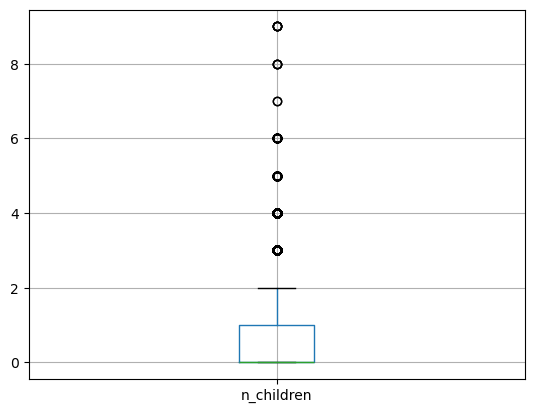

In [165]:
df.boxplot(column=['n_children'])

## Duplicated datas

In [166]:
df[df.duplicated()].shape

(0, 22)

**so we dont have any duplicated datas in our dataset**


---


## Feature engineering

In this part we should make all the datas numerical values in order to use it in our mechine learning algorithms 

In [167]:
df.select_dtypes(include = "object").columns

Index(['search_date', 'checkIn_date', 'checkOut_date'], dtype='object')

In [168]:
time_columns = ['search_date', 'checkIn_date', 'checkOut_date']

for col in time_columns:
     df[col]=pd.to_datetime(df[col])


In [169]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 22 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   user_location_country  100000 non-null  int64         
 1   user_location_region   100000 non-null  int64         
 2   user_location_city     100000 non-null  int64         
 3   destination_distance   100000 non-null  float64       
 4   search_date            100000 non-null  datetime64[ns]
 5   is_mobile              100000 non-null  int64         
 6   is_package             100000 non-null  int64         
 7   channel                100000 non-null  int64         
 8   search_count           100000 non-null  int64         
 9   checkIn_date           100000 non-null  datetime64[ns]
 10  checkOut_date          100000 non-null  datetime64[ns]
 11  n_adults               100000 non-null  int64         
 12  n_children             100000 non-null  int64

we will delete distace_bin column later because it doesn't give us more information

---


## Date/Time transformtions:

In [170]:
df['search_date_hour'] = df['search_date'].dt.hour
df['search_date_dayofweek'] = df['search_date'].dt.dayofweek
df['checkIn_date_dayofweek'] = df['checkIn_date'].dt.dayofweek
df['search_date_month'] = df['search_date'].dt.month
df['checkIn_date_month'] = df['checkIn_date'].dt.month




In [171]:
## combine columns to give more meaningfull data 
df['stay_duration_nights'] = (df['checkOut_date'] - df['checkIn_date']).dt.days
### Domain Knowledge: Critical Values
df['is_long_stay'] = (df['stay_duration_nights'] >= 7).astype(int)  # 7+ nights

## combine columns to give more meaningfull data 
df['booking_window_days'] = (df['checkIn_date'] - df['search_date']).dt.days
### Domain Knowledge: Critical Values
df['is_last_minute'] = (df['booking_window_days'] <= 7).astype(int)  # Booked within 7 days
df['is_planned'] = ((df['booking_window_days'] >= 8) & (df['booking_window_days'] <= 30)).astype(int)

In [172]:
df = df.drop(columns=['checkOut_date', 'checkIn_date', 'search_date'])


In [173]:
df.describe()

,user_location_country,user_location_region,user_location_city,destination_distance,is_mobile,is_package,channel,search_count,n_adults,n_children,...,search_date_hour,search_date_dayofweek,checkIn_date_dayofweek,search_date_month,checkIn_date_month,stay_duration_nights,is_long_stay,booking_window_days,is_last_minute,is_planned
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,...,100000.000000,100000.000000,100000.000000,100000.0,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000
mean,87.640680,320.865930,28018.448280,2080.931025,0.108710,0.274080,6.148960,1.770670,1.989870,0.403490,...,13.718200,2.440000,3.232470,1.0,2.985670,3.584150,0.132470,64.186380,0.19147,0.230600
std,60.037788,211.613155,16720.065765,1767.437676,0.311277,0.446052,3.714777,1.537329,0.891457,0.746975,...,5.630173,2.050961,1.873399,0.0,2.285204,3.079687,0.339003,69.629508,0.39346,0.421219
min,0.000000,0.000000,3.000000,0.005600,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,1.0,1.000000,0.000000,0.000000,-6.000000,0.00000,0.000000
25%,66.000000,174.000000,13586.000000,988.742400,0.000000,0.000000,2.000000,1.000000,2.000000,0.000000,...,10.000000,1.000000,2.000000,1.0,1.000000,2.000000,0.000000,12.000000,0.00000,0.000000
50%,66.000000,318.000000,27655.000000,2080.931025,0.000000,0.000000,9.000000,1.000000,2.000000,0.000000,...,14.000000,2.000000,3.000000,1.0,2.000000,3.000000,0.000000,39.000000,0.00000,0.000000
75%,71.000000,395.000000,42328.000000,2080.931025,0.000000,1.000000,9.000000,2.000000,2.000000,1.000000,...,18.000000,4.000000,5.000000,1.0,4.000000,5.000000,0.000000,89.000000,0.00000,0.000000
max,239.000000,1021.000000,56507.000000,11675.600000,1.000000,1.000000,9.000000,39.000000,9.000000,9.000000,...,23.000000,6.000000,6.000000,1.0,12.000000,240.000000,1.000000,494.000000,1.00000,1.000000


we can see eccentrice numbers of max booking_window_days  and max stay_duration_nights  so we try to find out the reasonable interval of data . but for early planning  max booking_window_days  can be possible so we don't delete outleirs of this 

<Axes: >

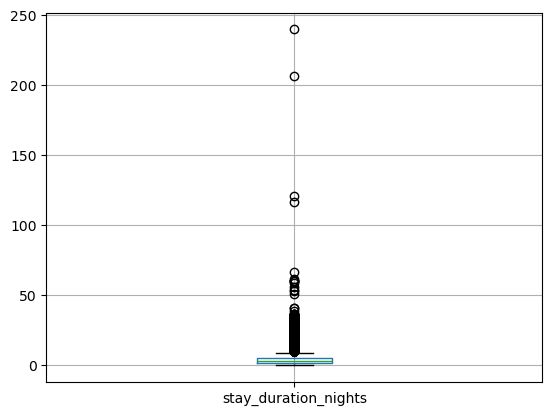

In [174]:
df.boxplot(column=['stay_duration_nights'])

more than 60 days for staying in a hotel can seem a very rare situation so it's better to delete other datas which shows more stay duration than 60 nights 

In [175]:
print(len(df[df['stay_duration_nights'] <= 60]))
df = df[df['stay_duration_nights'] <= 60].copy()

# 2. Reset index (very important)
df.reset_index(drop=True, inplace=True)


99994


## counts:


In [176]:

import seaborn as sns

# total people
df['n_people'] = df['n_adults'] + df['n_children']


## Ratio: Stay Length vs Booking Window

In [177]:
df["stay_to_booking_window_ratio"] = (
    df["stay_duration_nights"] / (df["booking_window_days"]+1).replace(0, np.nan)
)  
ratio_clean = df["stay_to_booking_window_ratio"].replace([np.inf, -np.inf], np.nan)


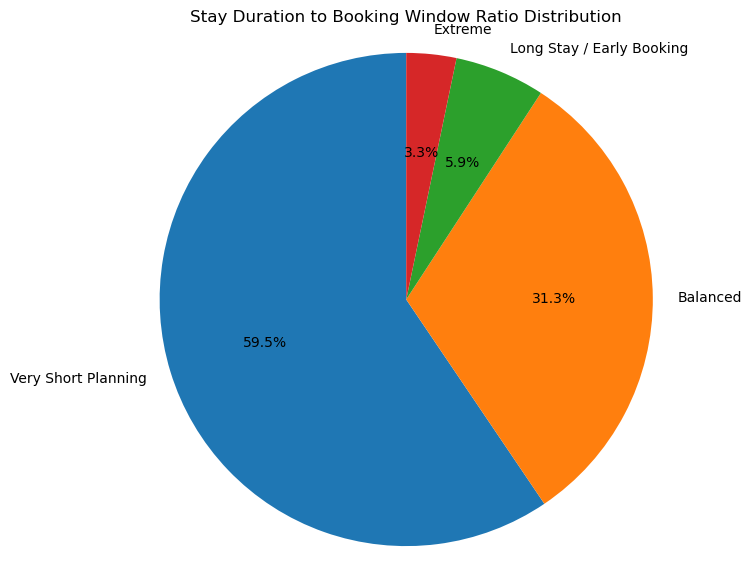

In [178]:

df["ratio_category"] = pd.cut(
    ratio_clean,
    bins=[-np.inf, 0.1, 0.5, 1, np.inf],
    labels=[
        "Very Short Planning",
        "Balanced",
        "Long Stay / Early Booking",
        "Extreme"
    ]
)
counts = df["ratio_category"].value_counts()

plt.figure(figsize=(7,7))
plt.pie(
    counts,
    labels=counts.index,
    autopct="%1.1f%%",
    startangle=90
)

plt.title("Stay Duration to Booking Window Ratio Distribution")
plt.axis("equal")
plt.show()


## RATIO:Nights per person

In [179]:
df["nights_per_person_ratio"] = (
    df["stay_duration_nights"] / (df["n_people"]).replace(0, np.nan)
)

## MANUAL FUNCTION

In [180]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Create subplot figure (1 row, 3 columns)
fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=[
        "n_people vs stay_duration_nights",
        "booking_window_days vs stay_duration_nights",
        "booking_window_days vs destination_distance"
    ],
    horizontal_spacing=0.08
)

# --- Scatter 1 ---
scatter1 = px.scatter(
    df,
    x="n_people",
    y="stay_duration_nights",
)
fig.add_trace(scatter1.data[0], row=1, col=1)

# --- Scatter 2 ---
scatter2 = px.scatter(
    df,
    x="stay_duration_nights",
    y="booking_window_days",

)
fig.add_trace(scatter2.data[0], row=1, col=2)

# --- Scatter 3 ---
scatter3 = px.scatter(
    df,
    x="destination_distance",
    y="booking_window_days",
    
)
fig.add_trace(scatter3.data[0], row=1, col=3)


# ------------------- Layout -------------------
fig.update_layout(
    height=500,
    width=1400,
    showlegend=False,
    title_text="Scatter Comparisons",
    title_x=0.5
)

# Axis labels
fig.update_xaxes(title_text="n_people",               row=1, col=1)
fig.update_yaxes(title_text="stay_duration_nights",  row=1, col=1)

fig.update_xaxes(title_text="stay_duration_nights",   row=1, col=2)
fig.update_yaxes(title_text="booking_window_days",  row=1, col=2)

fig.update_xaxes(title_text="destination_distance",  row=1, col=3)
fig.update_yaxes(title_text="booking_window_days",   row=1, col=3)

# Show figure
fig.show()


as it seems we can't find a  known nonlinear function to make features related to eachother because while in one particular x we can see a wide range of y feature in our data set , but we can see that they may follow one individual destribution.
**we can use the inforamtion of the distribution if our dataset is big enough(our dataset is big enough) and we dont want to train it with linear regression models.**

In [181]:
# 1. Stats by stay duration
status_by_stay = df.groupby("stay_duration_nights")["booking_window_days"].agg(
    mean="mean",
    std="std",    
    mad=lambda x: (x - x.mean()).abs().mean()
)

# 2. Stats by number of people
status_by_people = df.groupby("n_people")["stay_duration_nights"].agg(
    mean="mean",
    std="std",    
    mad=lambda x: (x - x.mean()).abs().mean()
)

# 3. Join both
df = df.join(status_by_stay, on="stay_duration_nights", rsuffix="_stay")
df = df.join(status_by_people, on="n_people", rsuffix="_people")


---
## preprocessing 


In [182]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99994 entries, 0 to 99993
Data columns (total 39 columns):
 #   Column                        Non-Null Count  Dtype   
---  ------                        --------------  -----   
 0   user_location_country         99994 non-null  int64   
 1   user_location_region          99994 non-null  int64   
 2   user_location_city            99994 non-null  int64   
 3   destination_distance          99994 non-null  float64 
 4   is_mobile                     99994 non-null  int64   
 5   is_package                    99994 non-null  int64   
 6   channel                       99994 non-null  int64   
 7   search_count                  99994 non-null  int64   
 8   n_adults                      99994 non-null  int64   
 9   n_children                    99994 non-null  int64   
 10  n_rooms                       99994 non-null  int64   
 11  destination                   99994 non-null  int64   
 12  destination_type              99994 non-null  

First, as people_bin and stay_bin won't give us more valuable information i decided to delete these columns.

In [183]:
df = df.drop(columns=['distance_bin','search_date_hour'])


But, ratio_category gives us a good insight about how most of the booked planned was, so we keep it.

In [184]:
df = pd.get_dummies(df, columns=["ratio_category"], drop_first=True)


In [185]:
df['stay_to_booking_window_ratio'] = df['stay_to_booking_window_ratio'].fillna(
    df['stay_to_booking_window_ratio'].mean()
)


## Binary columns

In [186]:
binary_cols=[
    "is_mobile",
    "is_package",
    "is_booking",
    "is_long_stay",
    "is_last_minute",
    "is_planned",
    "is_long_stay",
    "is_last_minute",
    "is_planned" 
]

## Categorical columns

In [187]:
categorical_cols = [
    "user_location_country",
    "user_location_region",
    "user_location_city",
    "channel",
    "destination",
    "destination_type",
    "hotel_continent",
    "hotel_country",
    "hotel_market",
    "hotel_category",
]


In [188]:

from sklearn.model_selection import KFold
from category_encoders import TargetEncoder
from sklearn.preprocessing import OneHotEncoder

# ------------------------
# 1. Define columns
# ------------------------
low_cols = ["channel", "destination_type", "hotel_continent"]

high_cols = [
    "user_location_city","user_location_country","user_location_region", 
    "hotel_country","hotel_market","hotel_category","destination"
]

target = "is_booking"

# ------------------------
# 2. One-Hot Encode low-cardinality features
# ------------------------
encoder_ohe = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoded_low = encoder_ohe.fit_transform(df[low_cols])

encoded_low_df = pd.DataFrame(
    encoded_low,
    columns=encoder_ohe.get_feature_names_out(low_cols)
)

# ------------------------
# 3. CV Target Encoding (manual, leakage-free)
# ------------------------
kf = KFold(n_splits=5, shuffle=True, random_state=42)

encoded_high = pd.DataFrame(index=df.index)

for col in high_cols:
    tmp = pd.Series(index=df.index, dtype=float)

    for train_idx, val_idx in kf.split(df):
        te = TargetEncoder(cols=[col])

        te.fit(df.iloc[train_idx][col], df.iloc[train_idx][target])

        tmp.iloc[val_idx] = te.transform(
            df.iloc[val_idx][col]
        ).iloc[:, 0].values

    encoded_high[col + "_te"] = tmp


# ------------------------
# 4. Keep numerical columns
# ------------------------
numerical_cols = [
    c for c in df.columns 
    if c not in low_cols + high_cols + [target]
]

# ------------------------
# 5. Build final dataset
# ------------------------
final_features = pd.concat([
    encoded_low_df.reset_index(drop=True),
    encoded_high.reset_index(drop=True),
], axis=1)




In [189]:
# Drop the original categorical columns
df_clean = df.drop(columns=low_cols + high_cols)

# Add the encoded features
df = pd.concat([df_clean, final_features], axis=1)

##  Continuous Numerical Columns

In [190]:
numerical_cols = [
    "destination_distance",
    "search_count",
    "n_adults",
    "n_children",
    "n_rooms",
    "stay_duration_nights",
    "booking_window_days",
    "n_people",
    "stay_to_booking_window_ratio",
 "mean","std","mad","mean_people","std_people","mad_people"
]


In [191]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

df[numerical_cols] = scaler.fit_transform(df[numerical_cols])


In [192]:
corr=df.corr()
corr.style.background_gradient(cmap='coolwarm')


c:\ProgramData\anaconda3\Lib\site-packages\pandas\io\formats\style.py:3807: RuntimeWarning:

All-NaN slice encountered

c:\ProgramData\anaconda3\Lib\site-packages\pandas\io\formats\style.py:3808: RuntimeWarning:

All-NaN slice encountered



,destination_distance,is_mobile,is_package,search_count,n_adults,n_children,n_rooms,is_booking,search_date_dayofweek,checkIn_date_dayofweek,search_date_month,checkIn_date_month,stay_duration_nights,is_long_stay,booking_window_days,is_last_minute,is_planned,n_people,stay_to_booking_window_ratio,nights_per_person_ratio,mean,std,mad,mean_people,std_people,mad_people,ratio_category_Balanced,ratio_category_Long Stay / Early Booking,ratio_category_Extreme,channel_0,channel_1,channel_2,channel_3,channel_4,channel_5,channel_6,channel_7,channel_8,channel_9,destination_type_1,destination_type_3,destination_type_4,destination_type_5,destination_type_6,destination_type_8,hotel_continent_0,hotel_continent_2,hotel_continent_3,hotel_continent_4,hotel_continent_5,hotel_continent_6,user_location_city_te,user_location_country_te,user_location_region_te,hotel_country_te,hotel_market_te,hotel_category_te,destination_te
destination_distance,1.000000,-0.011928,0.004915,0.030248,-0.005949,-0.019478,-0.007177,-0.037825,0.019527,-0.041058,nan,0.205855,0.153861,0.111396,0.203220,-0.180135,-0.038628,-0.016330,-0.062151,0.132995,0.161854,0.159374,0.160505,-0.000348,0.024435,0.003245,-0.056409,-0.059793,-0.025147,-0.016040,-0.002669,0.000195,0.053859,-0.009007,0.021683,-0.002869,-0.006965,-0.002324,-0.015823,0.034632,0.001995,-0.061688,0.017871,-0.022517,-0.003873,0.088483,-0.401812,0.303070,-0.021319,0.067126,0.233458,-0.014944,-0.052059,-0.029137,-0.160761,-0.147734,-0.122460,-0.101301
is_mobile,-0.011928,1.000000,0.050993,0.002312,0.032150,0.015578,-0.005833,-0.030534,0.050901,0.009802,nan,0.008387,0.022218,0.020899,0.005444,0.013342,-0.024636,0.033148,0.007602,-0.004398,0.033978,0.033775,0.031558,0.050972,0.033688,0.047703,-0.008595,0.004918,0.004380,0.049600,-0.011198,0.002147,-0.018163,-0.019759,-0.043010,-0.005487,-0.017129,-0.001316,0.006765,0.003833,0.005918,0.012530,-0.008776,-0.009491,0.001622,-0.001515,0.009452,-0.018021,0.032075,-0.003137,-0.024164,-0.012462,0.008681,-0.001886,-0.020712,-0.038912,-0.032135,-0.039469
is_package,0.004915,0.050993,1.000000,0.007396,0.023883,-0.049027,-0.038593,-0.039853,0.009160,0.001259,nan,0.157406,0.295889,0.212906,0.157735,-0.185996,-0.066871,-0.012608,-0.054884,0.221611,0.398440,0.362259,0.364963,0.062655,0.053036,0.052622,0.002760,-0.064243,-0.032504,0.041566,0.028652,-0.013825,0.000949,-0.000484,-0.078286,0.000847,0.006420,-0.000869,-0.013598,0.260027,-0.054308,-0.056091,-0.124623,-0.174655,-0.006014,-0.002199,-0.168963,-0.075646,0.311476,0.013061,0.001101,-0.048701,0.052549,-0.000731,-0.274587,-0.243875,-0.219406,-0.227074
search_count,0.030248,0.002312,0.007396,1.000000,0.017978,0.003651,-0.004209,-0.150654,0.012255,0.002256,nan,0.032867,0.021374,0.009578,0.031955,-0.032730,-0.012455,0.015427,-0.013657,0.008406,0.025148,0.022377,0.023415,0.018770,0.014063,0.018588,-0.011634,-0.012464,-0.008131,0.009411,0.008602,0.010071,0.008110,-0.003057,-0.006451,-0.000192,-0.002781,-0.003013,-0.015803,0.000370,-0.011121,0.004331,-0.007429,0.008750,-0.000418,-0.000101,-0.025577,0.010458,0.011801,-0.001027,0.013864,-0.012806,-0.012276,-0.016427,-0.027559,-0.021785,-0.006102,-0.016055
n_adults,-0.005949,0.032150,0.023883,0.017978,1.000000,0.094017,0.518723,-0.066962,0.022757,0.051646,nan,0.146900,0.037017,0.026283,0.145854,-0.138334,-0.067708,0.791103,-0.090134,-0.286791,0.062869,0.054584,0.055388,0.579548,0.132887,0.539805,-0.073751,-0.071202,-0.053758,0.013198,0.005826,-0.001582,0.033745,-0.005439,0.016993,0.003001,0.012266,-0.001248,-0.033728,0.000597,0.007929,0.028109,-0.026957,-0.004039,-0.006892,0.007003,-0.000863,-0.041559,0.046260,-0.002466,-0.006854,-0.021226,0.007385,-0.006347,-0.052419,-0.102929,-0.051709,-0.096102
n_children,-0.019478,0.015578,-0.049027,0.003651,0.094017,1.000000,0.075734,-0.028896,0.022328,0.053239,nan,0.104149,0.058213,0.066287,0.107706,-0.082717,-0.073314,0.683351,-0.061122,-0.221787,0.072498,0.071847,0.071247,0.432885,0.040739,0.441055,-0.049540,-0.046510,-0.038748,-0.004616,-0.008271,-0

In [ ]:
df.drop(columns='search_date_month',inplace=True)


KeyError: "['search_date_month'] not found in axis"

In [197]:
df.dropna(inplace=True)


In [194]:
corr_target = df.corr()['is_booking'].sort_values(ascending=False)
print(corr_target)


is_booking                                  1.000000
hotel_category_te                           0.104925
hotel_market_te                             0.102343
is_last_minute                              0.099876
destination_te                              0.089573
hotel_country_te                            0.070355
hotel_continent_2                           0.046626
channel_4                                   0.041764
ratio_category_Long Stay / Early Booking    0.040540
user_location_city_te                       0.038966
stay_to_booking_window_ratio                0.034467
user_location_region_te                     0.033321
is_planned                                  0.029397
destination_type_5                          0.028097
channel_9                                   0.026457
user_location_country_te                    0.023266
ratio_category_Balanced                     0.020313
destination_type_6                          0.017628
channel_5                                   0.

we can get useful inforamtion from correlation on integer_coded categorical columns but we should be careful about:

A high correlation can still be real (some IDs might be consistently high/low target).

**But the value and sign of correlation are often not stable or interpretable.**
we can **Use sklearn.feature_selection.mutual_info_classif for classification targets.This captures any dependency (not just linear).**

In [200]:
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split

# -------------------------
# 1. Separate features and target
# -------------------------

target = "is_booking"

X = df.drop(columns=[target])
y = df[target]

# -------------------------
# 2. Train / validation split
# (recommended to avoid leakage)
# -------------------------

X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42
)



discrete_mask = X_train.columns.isin(categorical_cols)

# -------------------------
# 4. Compute mutual information
# -------------------------

mi_scores = mutual_info_classif(
    X_train,
    y_train,
    discrete_features=discrete_mask,
    random_state=42
)

# -------------------------
# 5. Convert to dataframe
# -------------------------

mi_scores = pd.Series(mi_scores, index=X_train.columns)

mi_scores = mi_scores.sort_values(ascending=False)

print(mi_scores)


search_count                                0.040066
destination_type_1                          0.013379
channel_9                                   0.013378
std                                         0.013104
hotel_continent_2                           0.012309
mean                                        0.011360
mad                                         0.011309
stay_duration_nights                        0.010783
stay_to_booking_window_ratio                0.010009
n_children                                  0.009121
checkIn_date_month                          0.008408
n_people                                    0.007977
destination_te                              0.007513
nights_per_person_ratio                     0.007343
hotel_category_te                           0.006866
booking_window_days                         0.006710
mad_people                                  0.006116
std_people                                  0.006097
n_adults                                    0.